In [1]:
import pandas as pd
from sklearn.cluster import KMeans
room = "052"
room_type = "open_space"
outlier_threshold = 40.0

def load_datasets(room):
    datasets = []
    dataset_files = ['Sensors-Thingy-eCO2-sampled10min.csv', 'Sensors-Thingy-sound-sampled10min.csv', 'Sensors-Thingy-color_b-sampled10min.csv',
                 'Sensors-Thingy-color_c-sampled10min.csv', 'Sensors-Thingy-color_g-sampled10min.csv', 'Sensors-Thingy-color_r-sampled10min.csv']
    for file in dataset_files:
        dataset = pd.read_csv(file)
        columns_with_001 = [col for col in dataset.columns if room in col]
        if columns_with_001:
            dataset_001 = dataset[['time_ms'] + columns_with_001] 
            datasets.append(dataset_001)
    return datasets

datasets = load_datasets(room)

In [2]:
from sklearn.preprocessing import MinMaxScaler


def preprocess_data(datasets, room):
    scaler = MinMaxScaler(feature_range=(1, 100))

    combined_dataset = pd.concat(datasets)
        
    columns_to_scale = ['thingy' + room + '_eCO2','thingy' + room + '_sound','thingy' + room + '_color_g',
                        'thingy' + room + '_color_b','thingy' + room + '_color_c','thingy' + room + '_color_r']

    combined_dataset[columns_to_scale] = scaler.fit_transform(combined_dataset[columns_to_scale])

    # Set 'time_ms' column as datetime and fill missing values
    combined_dataset['time_ms'] = pd.to_datetime(combined_dataset['time_ms'])
    combined_dataset = combined_dataset.fillna(0)

    # Set 'time_ms' as the index
    combined_dataset.set_index('time_ms', inplace=True)

    # Check for duplicates in the index (timestamps) and handle them if found
    if combined_dataset.index.duplicated().any():
        combined_dataset = combined_dataset.groupby(combined_dataset.index).max()

    return combined_dataset

combined_dataset = preprocess_data(datasets,room)

In [3]:
def pivot_and_resample(combined_dataset):
    sensor_columns = combined_dataset.columns
    # Create a new column that represents the minute within the hour
    combined_dataset['minute'] = combined_dataset.index.minute

    # Pivot the data to have columns for each sensor and minute interval
    pivot_table = combined_dataset.pivot_table(index=combined_dataset.index, columns=['minute'], values=sensor_columns, aggfunc='sum')

    pivot_table = pivot_table.fillna(0)

    # Resample the pivoted data to 1-hour intervals and take the sum
    new_features_df = pivot_table.resample('1H').sum() 

    return new_features_df

new_features_df = pivot_and_resample(combined_dataset)


C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklea

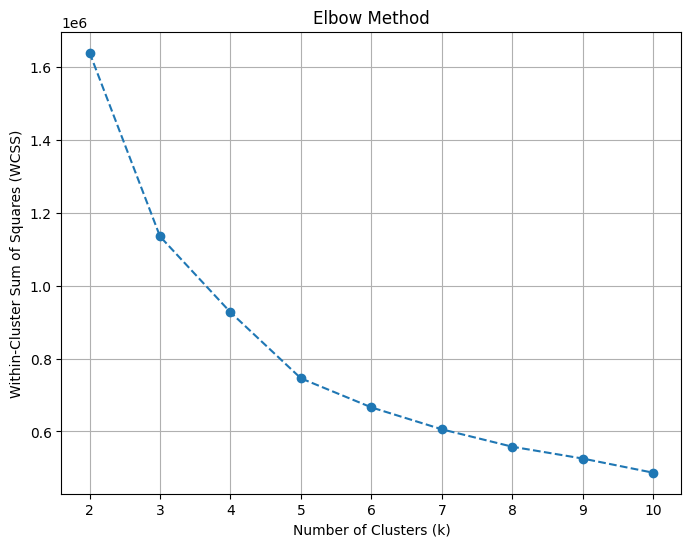

8


In [4]:
import matplotlib.pyplot as plt

# Calculate WCSS for different values of k
wcss = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(new_features_df[new_features_df.columns])
    wcss.append(kmeans.inertia_)

# Find the k with the highest elbow method score
deltas = [wcss[i] - wcss[i-1] for i in range(1, len(wcss))]
optimal_clusters_elbow = deltas.index(max(deltas)) + 2

# Plot the Elbow Method graph
plt.figure(figsize=(8, 6))
plt.plot(range(2, 11), wcss, marker='o', linestyle='--')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method')
plt.grid()
plt.show()

print(optimal_clusters_elbow)

#The chosen k value should be based on the point where the decrease in WCSS becomes less significant, 
#indicating that adding more clusters doesn't significantly improve the clustering quality.

In [5]:
from sklearn.metrics import silhouette_score

def silhouete_number():
    #Silhouette analysis measures how similar each data point in one cluster is to the data points in the neighboring clusters.
    silhouette_scores = []
    for k in range(2, 11):
        kmeans = KMeans(n_clusters=k, random_state=42)
        cluster_labels = kmeans.fit_predict(new_features_df[new_features_df.columns])
        silhouette_avg = silhouette_score(new_features_df[new_features_df.columns], cluster_labels)
        silhouette_scores.append(silhouette_avg)

    # Find the k with the highest silhouette score
    optimal_clusters = silhouette_scores.index(max(silhouette_scores)) + 2  # Add 2 because k starts from 2
    return optimal_clusters

cluster_num = silhouete_number()
print(cluster_num)

C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklea

2


In [6]:
def combine_scores():
    silhouette_scores = []
    inertias = []
    for k in range(2, 11):
        kmeans = KMeans(n_clusters=k, random_state=42)
        cluster_labels = kmeans.fit_predict(new_features_df[new_features_df.columns])
        silhouette_avg = silhouette_score(new_features_df[new_features_df.columns], cluster_labels)
        silhouette_scores.append(silhouette_avg)
        inertias.append(kmeans.inertia_)  # Sum of squared distances to closest cluster center

    deltas = [inertias[i] - inertias[i-1] for i in range(1, len(inertias))]
    # Calculate the average score of silhouette and elbow method
    combined_scores = [(silhouette_scores[i] + deltas[i-1]) / 2 for i in range(1, len(silhouette_scores))]

    # Find the index of the maximum combined score
    optimal_clusters_combined = combined_scores.index(max(combined_scores)) + 2  # Add 2 because k starts from 2

    return optimal_clusters_combined

score = combine_scores()
print(score)

C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklea

8


In [7]:
# Perform K-means clustering 
def k_means(cluster_num):
    kmeans = KMeans(n_clusters = score)  # Number of clusters after checking the elbow method plot and silhouette analysis

    kmeans.fit(new_features_df[new_features_df.columns])

    cluster_labels = kmeans.labels_
    return kmeans

kmeans = k_means(cluster_num)
kmeans_labels = kmeans.labels_

C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2516 samples in 0.001s...


C:\Users\34665\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 2516 samples in 0.132s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2516
[t-SNE] Computed conditional probabilities for sample 2000 / 2516
[t-SNE] Computed conditional probabilities for sample 2516 / 2516
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 87.406593
[t-SNE] KL divergence after 300 iterations: 1.879722


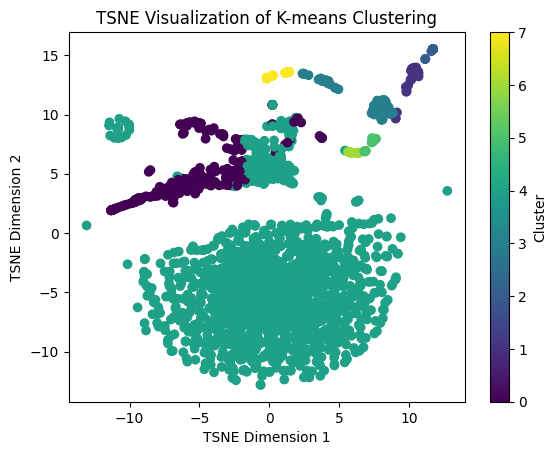

In [8]:
from sklearn.manifold import TSNE

# Perform t-SNE dimensionality reduction
tsne2D = TSNE(n_components=2, random_state=42, verbose=1, n_iter=300)
tsne_representation2D = tsne2D.fit_transform(new_features_df[new_features_df.columns])

# Plot the t-SNE representation with color-coded clusters
plt.scatter(tsne_representation2D[:, 0], tsne_representation2D[:, 1], c=kmeans_labels, cmap='viridis')
plt.title("TSNE Visualization of K-means Clustering")
plt.xlabel("TSNE Dimension 1")
plt.ylabel("TSNE Dimension 2")
plt.colorbar(label='Cluster')
plt.show()

In [9]:
import hdbscan

def hdbscan_score():
    best_score = -10
    best_params = {'min_cluster_size': None, 'min_samples': None}

    #perform a grid search for best parameters
    for min_cluster_size in range(5, 20):
        for min_samples in range(1, 5):
            hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples)
            cluster_labels_HDB = hdbscan_model.fit_predict(new_features_df[new_features_df.columns])
            silhouette = silhouette_score(new_features_df[new_features_df.columns], cluster_labels_HDB)

            if silhouette > best_score:
                best_score = silhouette
                best_params['min_cluster_size'] = min_cluster_size
                best_params['min_samples'] = min_samples
                
    return best_params

best_params = hdbscan_score()
print(f"Best Parameters: {best_params}")

Best Parameters: {'min_cluster_size': 6, 'min_samples': 1}


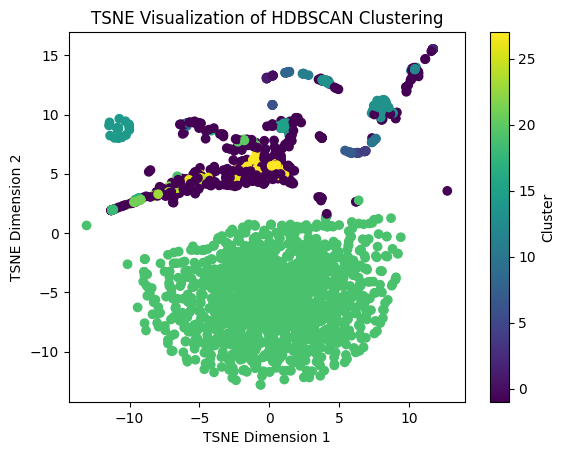

In [10]:
def hdb_model():
    hdbscan_model = hdbscan.HDBSCAN(min_cluster_size = best_params['min_cluster_size'], min_samples = best_params['min_samples']) 
    cluster_labels_HDB = hdbscan_model.fit_predict(new_features_df[new_features_df.columns])
    
    return hdbscan_model

hdbscan_model = hdb_model()

plt.scatter(tsne_representation2D[:, 0], tsne_representation2D[:, 1], c=hdbscan_model.labels_, cmap='viridis')
plt.title("TSNE Visualization of HDBSCAN Clustering")
plt.xlabel("TSNE Dimension 1")
plt.ylabel("TSNE Dimension 2")
plt.colorbar(label='Cluster')
plt.show()

In [11]:
import numpy as np

def hdbscan_cluster_centers():
    # Find the persistence diagram
    cluster_persistence = hdbscan_model.cluster_persistence_

    hdbscan_labels = hdbscan_model.labels_

    # Extract representative points for each cluster
    representative_points = []

    for cluster_id, persistence in enumerate(cluster_persistence):
            cluster_indices = np.where(hdbscan_labels == cluster_id)[0]

            if len(cluster_indices) > 0:
                # Take the mean of each feature within the cluster
                cluster_representative = new_features_df.iloc[cluster_indices].mean() 
                representative_points.append(cluster_representative)

    # Convert the list of representative points to a DataFrame if needed
    representative_points_df = pd.DataFrame(representative_points, columns=new_features_df.columns)
    representative_points_df = representative_points_df.reset_index(drop=True)

    return representative_points_df

representative_points_df = hdbscan_cluster_centers()
print(representative_points_df.values)

[[27.75520833 27.69791667 27.69791667 ...  6.73252688  8.15188172
   6.33333333]
 [31.14423077 31.14423077  2.32211538 ...  8.65632754  8.41066998
   9.80272953]
 [43.37946429 43.18303571 43.03571429 ...  8.03341014  7.42511521
   6.74078341]
 ...
 [ 1.          1.          1.         ...  9.78225806  9.78225806
   9.74677419]
 [ 1.          1.          1.         ...  8.89516129  8.76209677
   9.8266129 ]
 [ 1.0237069   1.03556034  1.02963362 ...  7.91476641  8.06618465
   8.04324249]]


In [12]:
from sklearn.metrics import davies_bouldin_score

def choose_model():
    choosen_model = {'cluster_labels': None, 'cluster_centers': None, 'model_choosen': None}

    hdbscan_labels = hdbscan_model.labels_

    silhouette_kmeans = silhouette_score(new_features_df[new_features_df.columns], kmeans_labels)
    silhouette_hdbscan = silhouette_score(new_features_df[new_features_df.columns], hdbscan_labels)

    # Lower values indicate better clustering in the Davies–Bouldin Index
    davies_bouldin_kmeans = davies_bouldin_score(new_features_df[new_features_df.columns], kmeans_labels)
    davies_bouldin_hdbscan = davies_bouldin_score(new_features_df[new_features_df.columns], hdbscan_labels)

    print(f'Silhouette Score (KMeans): {silhouette_kmeans}')
    print(f'Silhouette Score (HDBSCAN): {silhouette_hdbscan}')
    print(f'Davies-Bouldin Index (KMeans): {davies_bouldin_kmeans}')
    print(f'Davies-Bouldin Index (HDBSCAN): {davies_bouldin_hdbscan}')

    if silhouette_kmeans > silhouette_hdbscan and davies_bouldin_kmeans < davies_bouldin_hdbscan: 
        print("KMeans chosen as clustering model")
        choosen_model['cluster_labels'] = kmeans_labels
        choosen_model['cluster_centers'] = kmeans.cluster_centers_
        choosen_model['model_choosen'] = "KMeans"
    else:
        print("HDBSCAN chosen as clustering model")
        choosen_model['cluster_labels'] = hdbscan_labels
        choosen_model['cluster_centers'] = representative_points_df.values
        choosen_model['model_choosen'] = "HDBSCAN"
        
    return choosen_model

choosen_model = choose_model()
cluster_labels = choosen_model['cluster_labels']
cluster_centers = choosen_model['cluster_centers']

print(cluster_labels)

Silhouette Score (KMeans): 0.6716358345563886
Silhouette Score (HDBSCAN): 0.6256258775187747
Davies-Bouldin Index (KMeans): 0.9999603105084708
Davies-Bouldin Index (HDBSCAN): 1.3168832490669065
KMeans chosen as clustering model
[4 4 4 ... 3 3 7]


In [13]:
# Get the cluster centroids
centroids = cluster_centers

centroid_df = pd.DataFrame(centroids, columns=new_features_df.columns)

# Print the centroid values for each cluster
for cluster_idx, centroid in enumerate(centroid_df.values):
    print(f"Cluster {cluster_idx + 1} centroid:")
    for col_idx, column in enumerate(centroid_df.columns):
        print(f"{column}: {centroid[col_idx]}")
    print()

Cluster 1 centroid:
('thingy052_color_b', 0): 1.6693517080745361
('thingy052_color_b', 10): 1.3330745341614945
('thingy052_color_b', 20): 1.326669254658388
('thingy052_color_b', 30): 1.3021156832298133
('thingy052_color_b', 40): 1.3159937888198785
('thingy052_color_b', 50): 1.6864324534161454
('thingy052_color_c', 0): 1.5590062111801224
('thingy052_color_c', 10): 1.2291925465838478
('thingy052_color_c', 20): 1.1732919254658394
('thingy052_color_c', 30): 1.1397515527950315
('thingy052_color_c', 40): 1.162111801242236
('thingy052_color_c', 50): 1.5869565217391326
('thingy052_color_g', 0): 1.6364285714285733
('thingy052_color_g', 10): 1.2816273291925482
('thingy052_color_g', 20): 1.275478260869562
('thingy052_color_g', 30): 1.2441180124223599
('thingy052_color_g', 40): 1.2539565217391329
('thingy052_color_g', 50): 1.6579503105590074
('thingy052_color_r', 0): 1.7974134263592267
('thingy052_color_r', 10): 1.308857313026465
('thingy052_color_r', 20): 1.2976261380073213
('thingy052_color_r', 

In [14]:
import numpy as np
# Calculate the absolute differences between each centroid and the overall centroid
centroid_diff = centroids - centroids.mean(axis=0)

# Calculate the feature importance as the average absolute difference across clusters
feature_importance = np.absolute(centroid_diff).mean(axis=0)

# Sort the features by their importance scores
sorted_features = pd.Series(feature_importance, index=new_features_df.columns).sort_values(ascending=False)

print("Feature Importance:")
for feature, importance in sorted_features.items():
    print(f"{feature}: {importance}")

Feature Importance:
('thingy052_color_r', 0): 26.086393727884392
('thingy052_color_r', 10): 23.686231515239417
('thingy052_color_r', 40): 23.552243885724167
('thingy052_color_r', 20): 23.207716756870084
('thingy052_color_r', 50): 22.86901800168225
('thingy052_color_r', 30): 21.910157591547964
('thingy052_color_c', 0): 18.242393387393562
('thingy052_color_g', 0): 17.764207237063964
('thingy052_color_c', 40): 16.709249938131375
('thingy052_color_c', 10): 16.537071747028477
('thingy052_color_g', 40): 16.29598214806502
('thingy052_color_c', 20): 16.26647942015701
('thingy052_color_c', 50): 16.133216965595032
('thingy052_color_g', 10): 16.128930255533046
('thingy052_color_b', 0): 15.923022444203681
('thingy052_color_g', 20): 15.822046164859813
('thingy052_color_g', 50): 15.738605504343889
('thingy052_color_c', 30): 15.296756599151115
('thingy052_color_g', 30): 14.912734940558554
('thingy052_color_b', 40): 14.740096753883073
('thingy052_color_b', 10): 14.42652743600335
('thingy052_color_b', 

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 2516 samples in 0.001s...
[t-SNE] Computed neighbors for 2516 samples in 0.110s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2516

C:\Users\34665\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(



[t-SNE] Computed conditional probabilities for sample 2000 / 2516
[t-SNE] Computed conditional probabilities for sample 2516 / 2516
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.061913
[t-SNE] KL divergence after 300 iterations: 1.653558


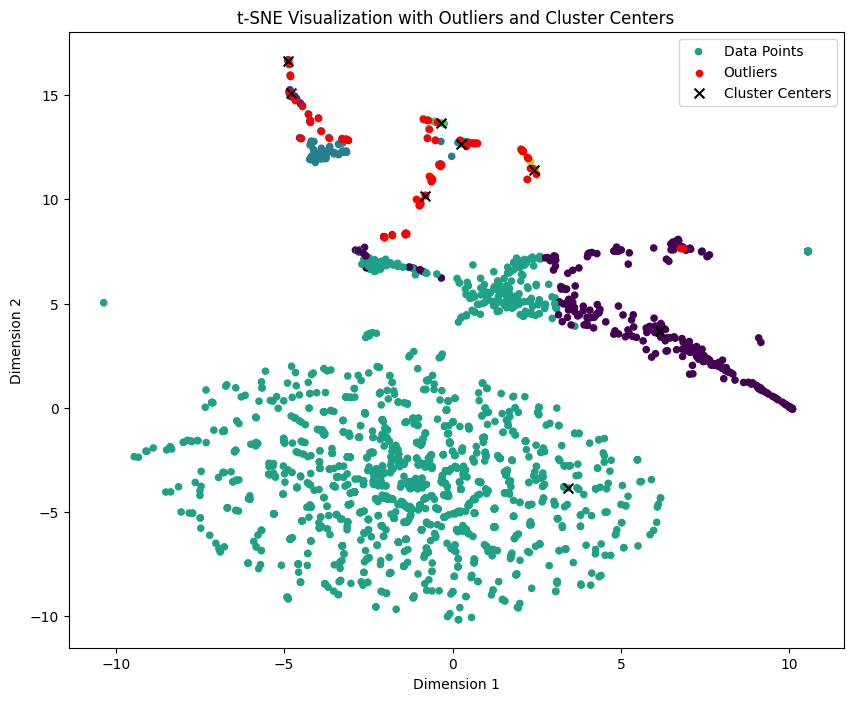

In [15]:
from sklearn.metrics import pairwise_distances_argmin_min
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def visualization(new_features_df):

    # Get indices of cluster center data points
    center_indices, _ = pairwise_distances_argmin_min(cluster_centers, new_features_df)

    cluster_center_data = new_features_df.iloc[center_indices]

    # Calculate distances from each data point to its assigned cluster center
    distances_to_centers = np.linalg.norm(new_features_df - cluster_centers[cluster_labels], axis=1)

    outlier_indices = np.where(distances_to_centers > outlier_threshold)[0]

    # Filter the DataFrame to include only outlier data points
    outlier_data = new_features_df.iloc[outlier_indices]

    tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
    tsne_representation = tsne.fit_transform(new_features_df)

    plt.figure(figsize=(10, 8))
    plt.scatter(tsne_representation[:, 0], tsne_representation[:, 1], c=cluster_labels, cmap='viridis', s=20, label='Data Points')
    plt.scatter(tsne_representation[outlier_indices, 0], tsne_representation[outlier_indices, 1], c='red', s=20, label='Outliers')
    plt.scatter(tsne_representation[center_indices, 0], tsne_representation[center_indices, 1], c='black', s=50, label='Cluster Centers', marker='x')

    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.title('t-SNE Visualization with Outliers and Cluster Centers')
    plt.legend()

    plt.show()
    return outlier_indices

outlier_indices = visualization(new_features_df)
outlier_data = new_features_df.iloc[outlier_indices]

In [16]:
import plotly.express as px

tsne_df = pd.DataFrame(tsne_representation2D, columns=['Dimension 1', 'Dimension 2'])

tsne_df['Cluster'] = cluster_labels

# Create a scatter plot with hover information using Plotly Express
fig = px.scatter(tsne_df, x='Dimension 1', y='Dimension 2', color='Cluster', hover_data=[cluster_labels])

# Add outliers to the plot with custom markers
fig.add_trace(
    px.scatter(
        tsne_df.loc[outlier_indices],
        x='Dimension 1',
        y='Dimension 2',
        color_discrete_sequence=['red'],
        hover_data=[outlier_indices]
    ).data[0]
)

fig.update_layout(
    title='t-SNE Visualization with Outliers',
    xaxis_title='Dimension 1',
    yaxis_title='Dimension 2',
    showlegend=True
)

fig.show()

C:\Users\34665\AppData\Local\Temp\ipykernel_25508\1452614872.py:14: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



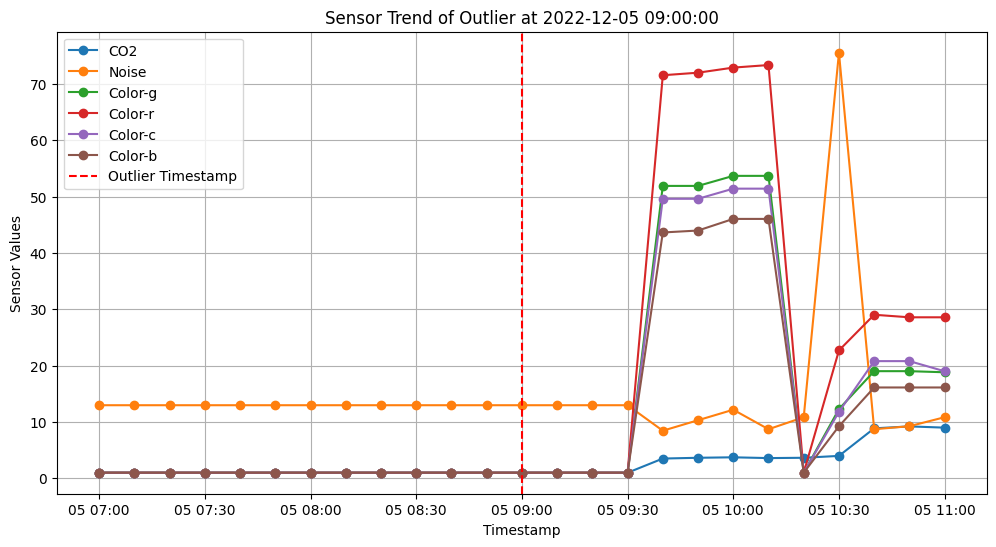

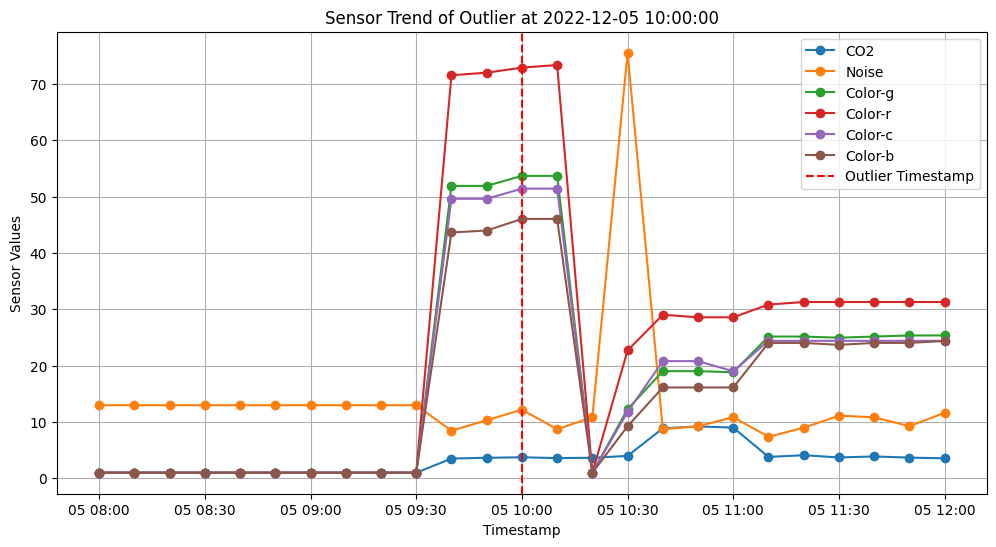

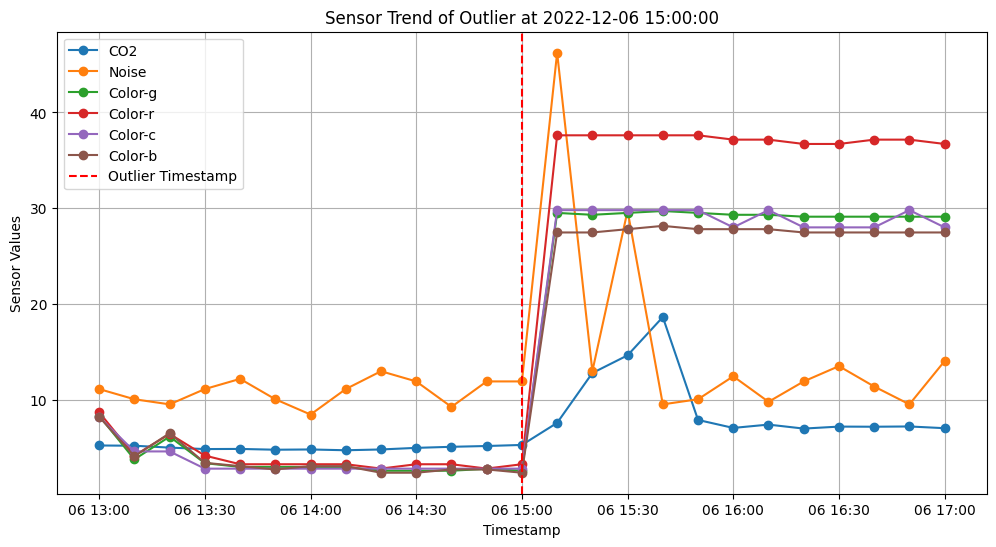

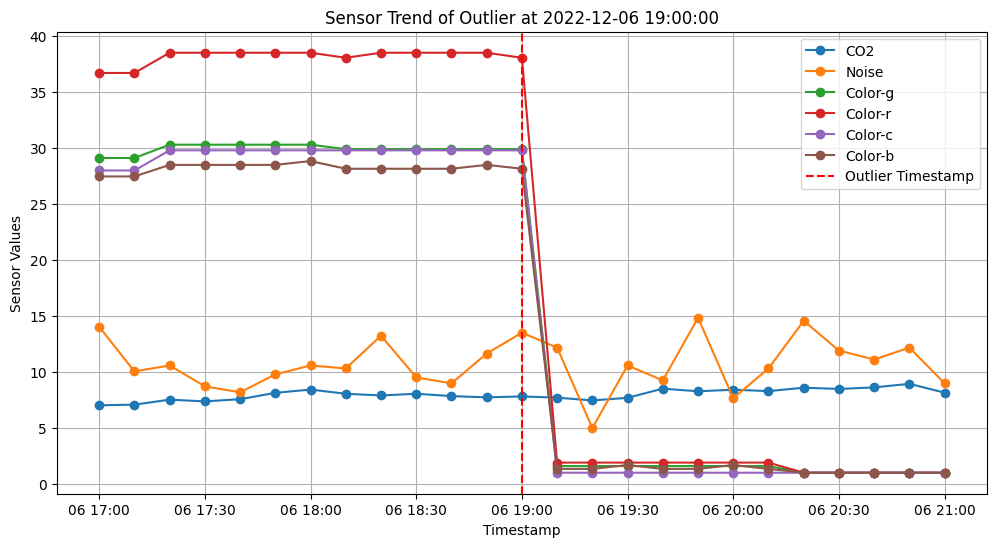

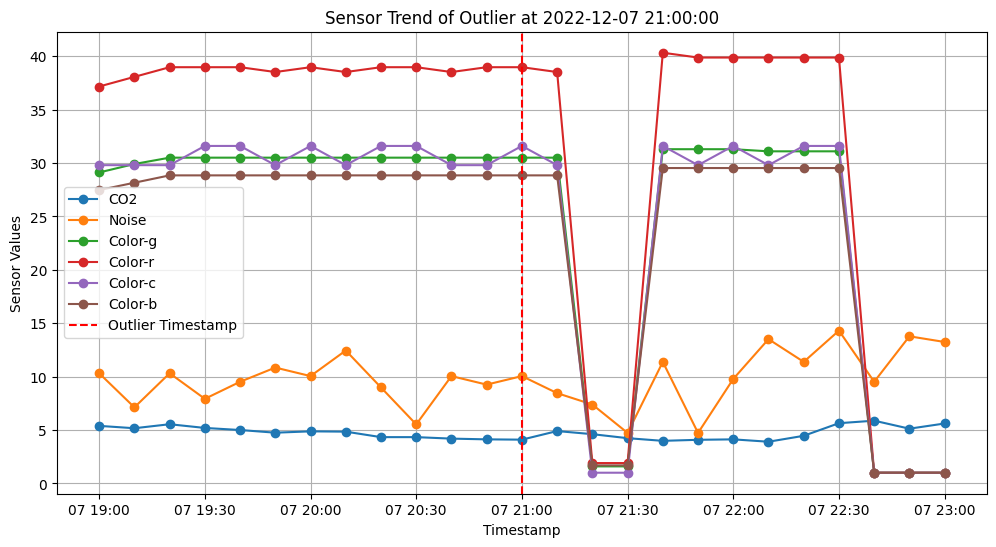

...

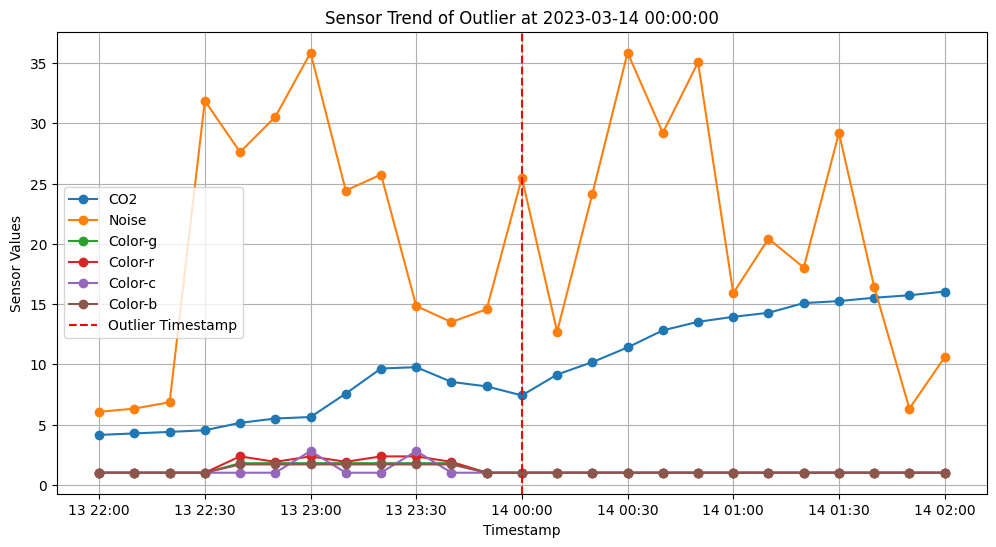

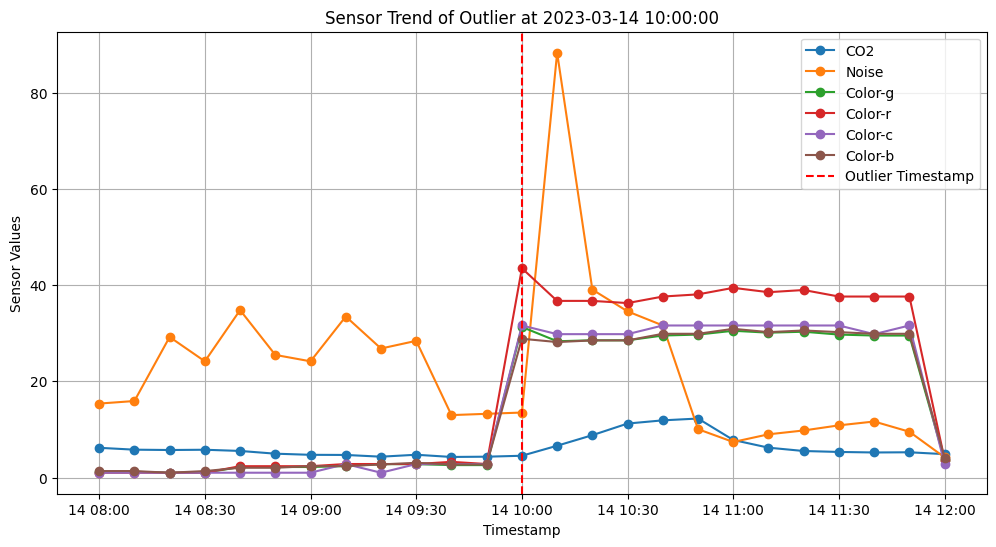

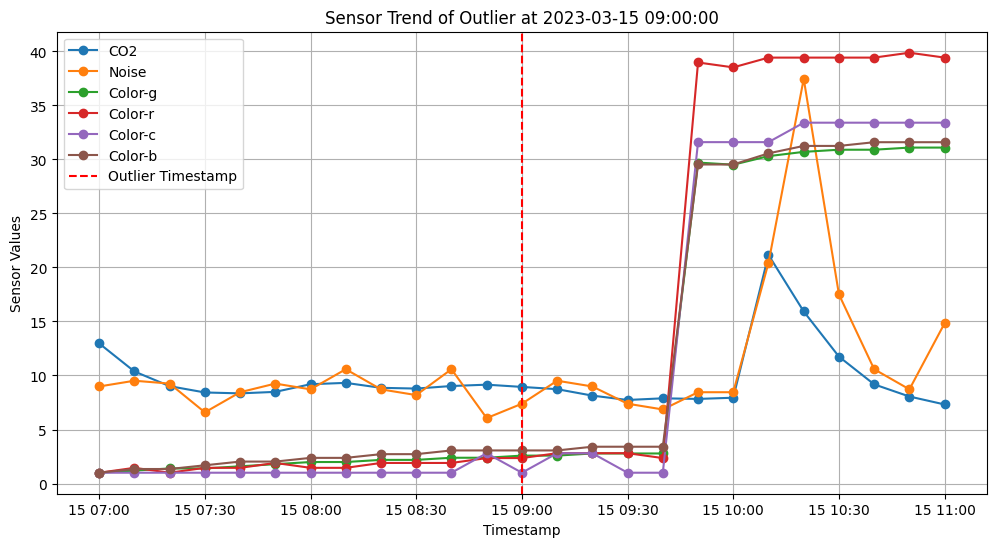

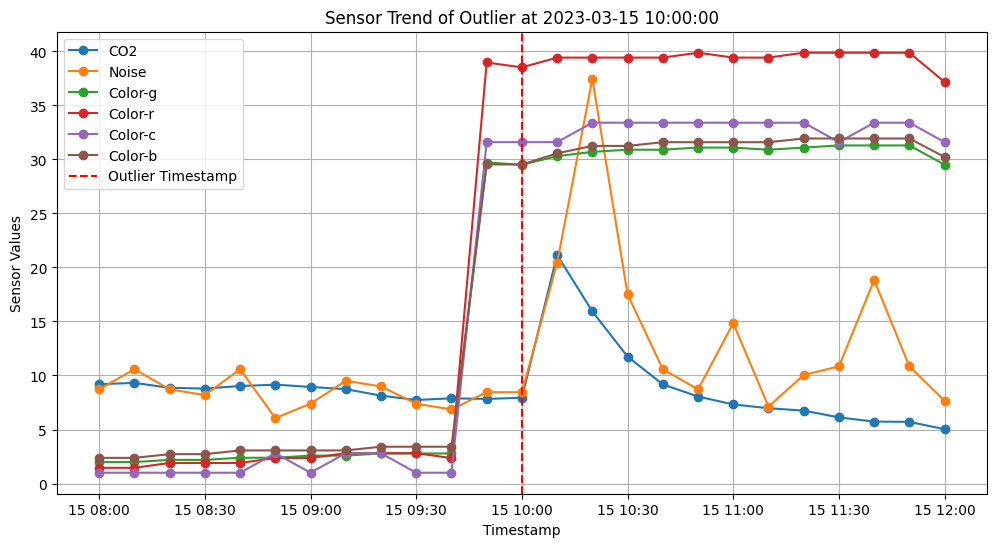

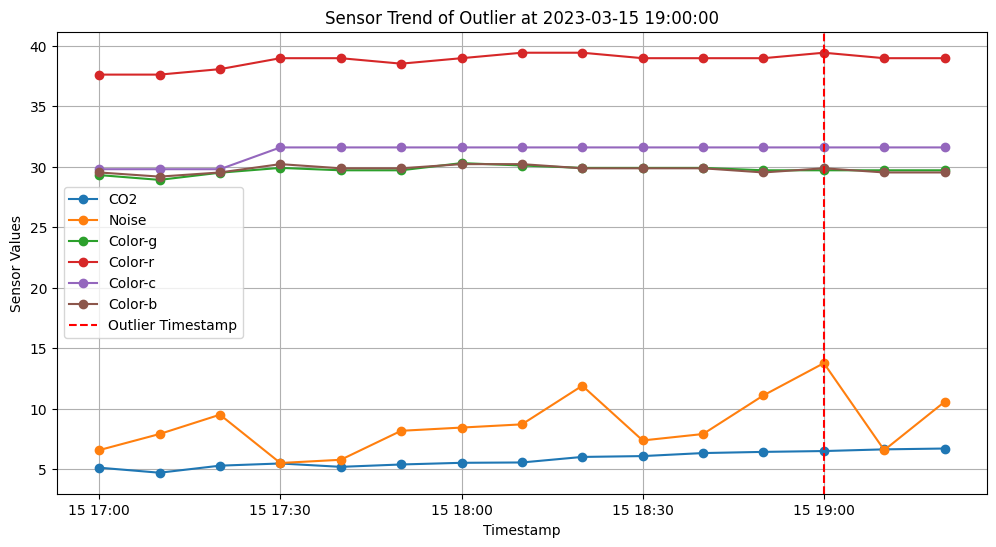

In [17]:
outlier_timestamps = outlier_data.index

window_size = pd.Timedelta(hours=2)  # this can be adjustto a larger time window

# Initialize a list to store data for plotting
plot_data = []

for timestamp in outlier_timestamps:
    # Extract the data within the defined time window
    start_time = timestamp - window_size
    end_time = timestamp + window_size
    data_within_window = combined_dataset[(combined_dataset.index >= start_time) & (combined_dataset.index <= end_time)]

    plt.figure(figsize=(12, 6))
    plt.plot(data_within_window.index, data_within_window['thingy' + room + '_eCO2'], label='CO2', marker='o')
    plt.plot(data_within_window.index, data_within_window['thingy' + room + '_sound'], label='Noise', marker='o')
    plt.plot(data_within_window.index, data_within_window['thingy' + room + '_color_g'], label='Color-g', marker='o')
    plt.plot(data_within_window.index, data_within_window['thingy' + room + '_color_r'], label='Color-r', marker='o')
    plt.plot(data_within_window.index, data_within_window['thingy' + room + '_color_c'], label='Color-c', marker='o')
    plt.plot(data_within_window.index, data_within_window['thingy' + room + '_color_b'], label='Color-b', marker='o')
    plt.axvline(x=timestamp, color='red', linestyle='--', label='Outlier Timestamp')
    plt.title(f'Sensor Trend of Outlier at {timestamp}')
    plt.xlabel('Timestamp')
    plt.ylabel('Sensor Values')
    plt.legend()
    plt.grid(True)

    plot_data.append({'Timestamp': timestamp, 'Type': 'Outlier', 'Plot': plt})

for data in plot_data:
    plt.show(data['Plot'])

Cluster 0: 322 data points
Cluster 1: 54 data points
Cluster 2: 23 data points
Cluster 3: 143 data points
Cluster 4: 1907 data points
Cluster 5: 21 data points
Cluster 6: 16 data points
Cluster 7: 30 data points


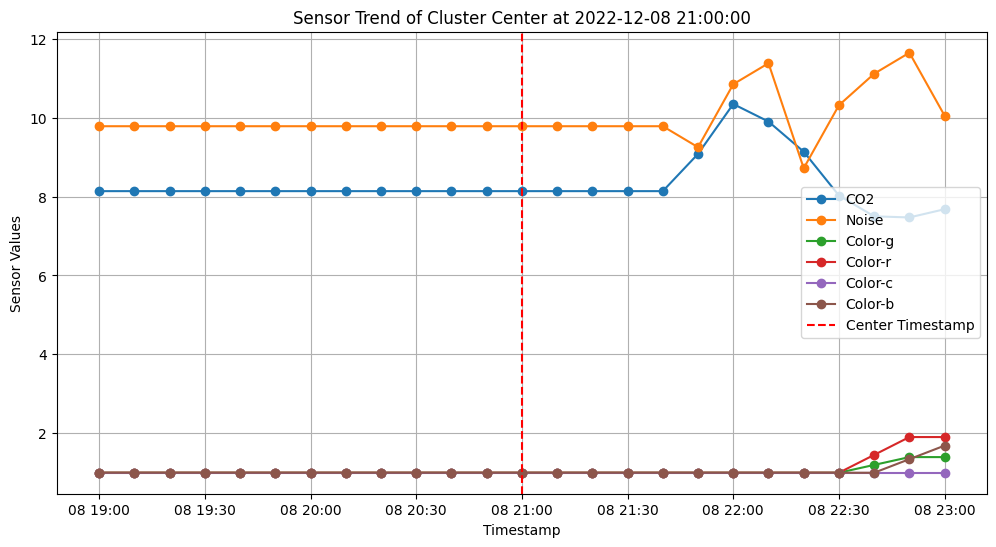

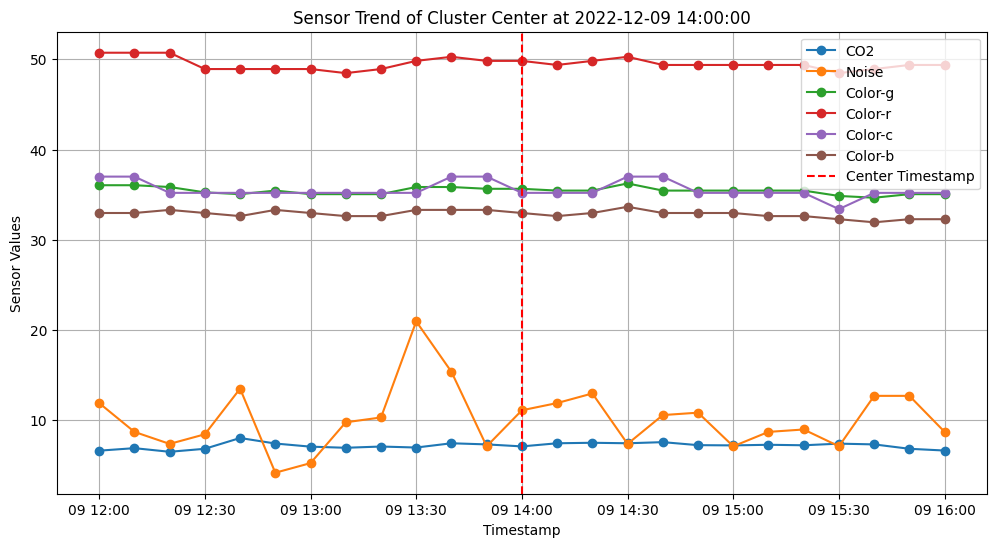

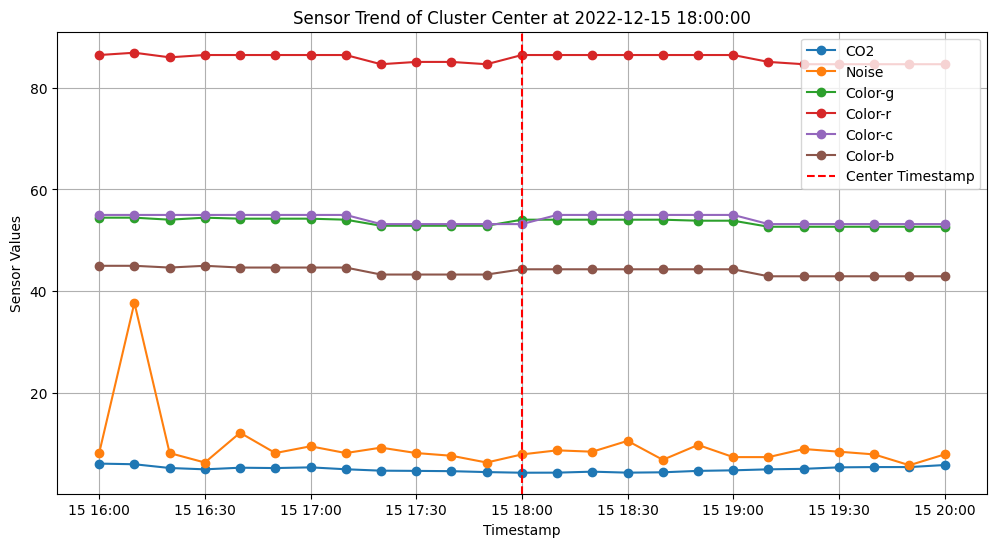

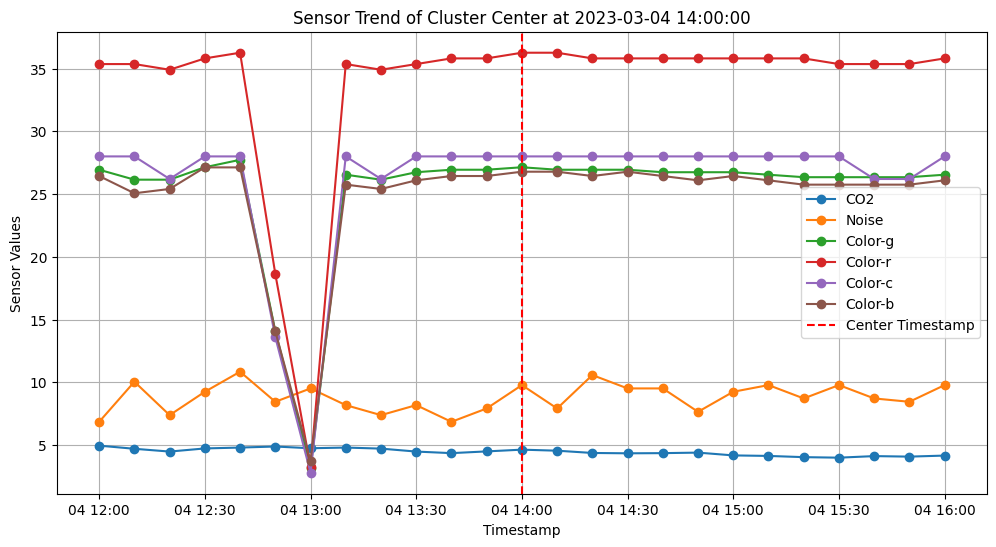

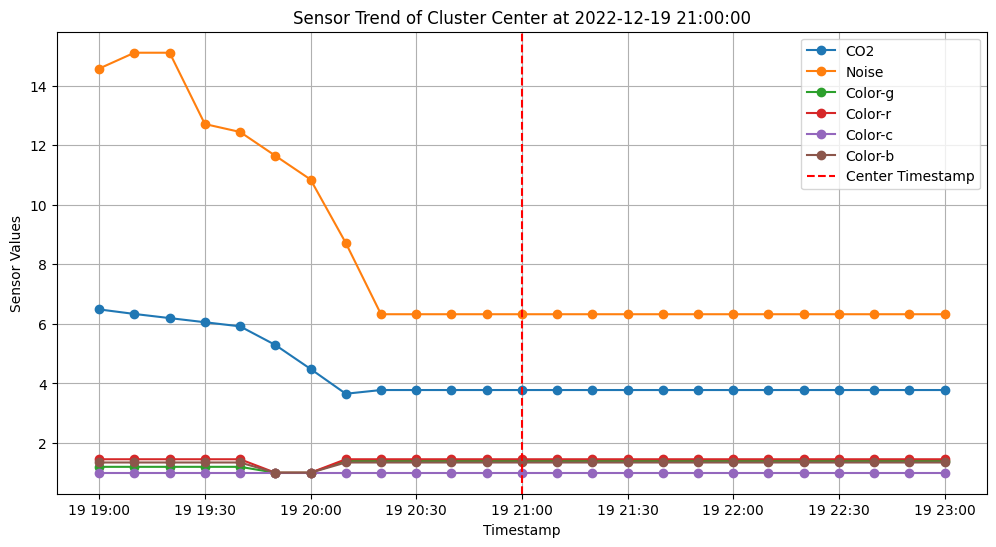

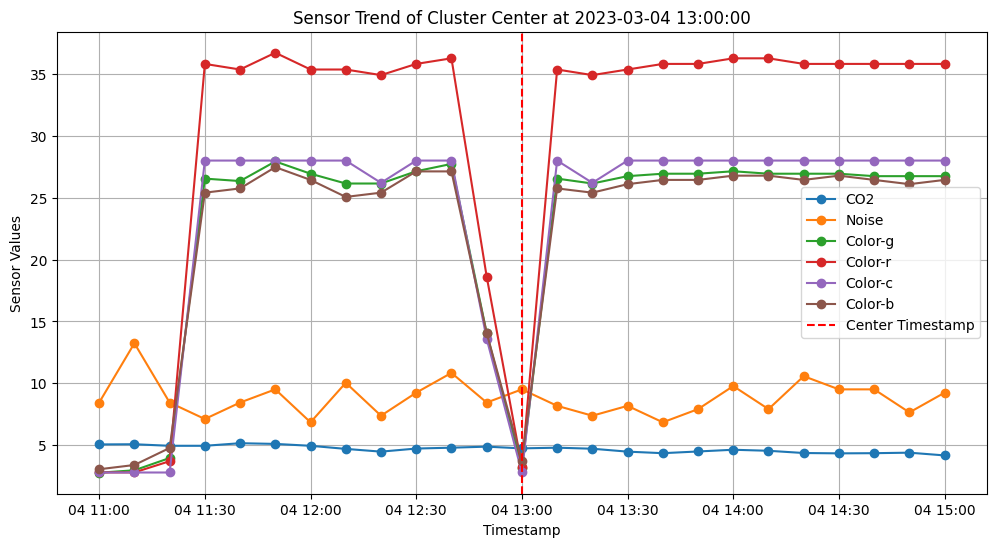

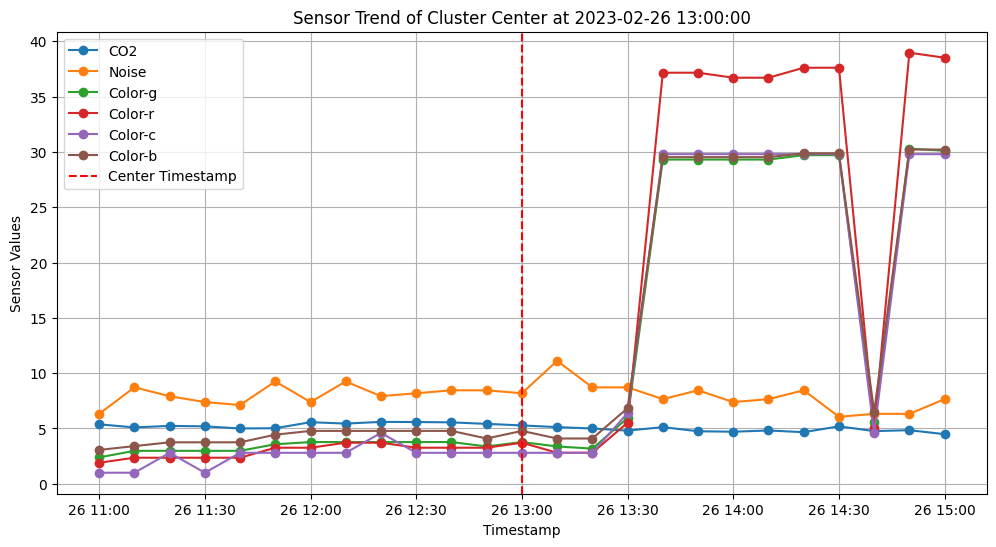

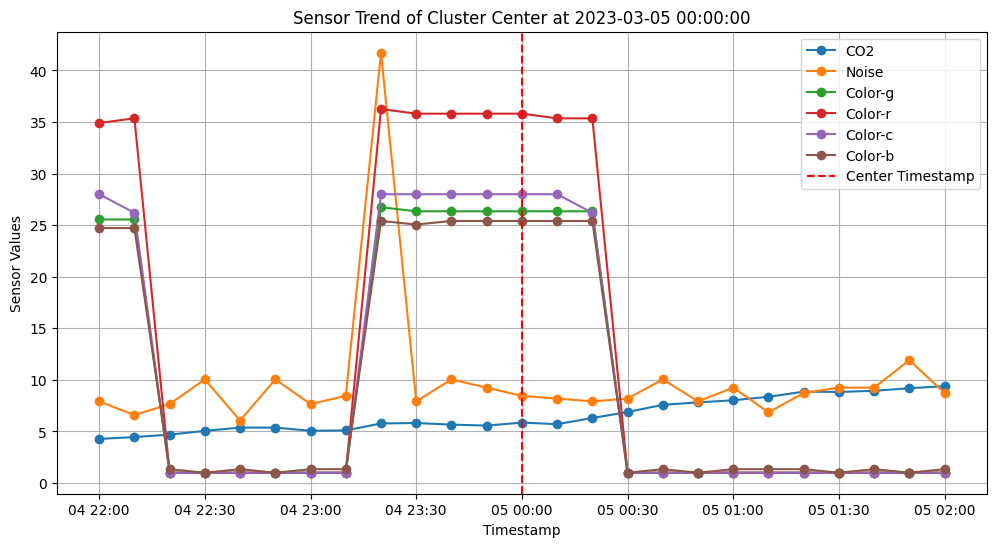

In [18]:
from sklearn.metrics.pairwise import pairwise_distances_argmin_min
from collections import Counter

# count the points in each cluster
cluster_counts = dict(Counter(cluster_labels))

# Get indices of cluster center data points
center_indices, _ = pairwise_distances_argmin_min(cluster_centers, new_features_df)

cluster_center_data = new_features_df.iloc[center_indices]
# Extract timestamps of centers
center_timestamps = cluster_center_data.index

window_size = pd.Timedelta(hours=2)  # this can be adjusted to a larger time window

plot_data = []

for timestamp in center_timestamps:
    # Extract the data within the defined time window
    start_time = timestamp - window_size
    end_time = timestamp + window_size
    data_within_window = combined_dataset[(combined_dataset.index >= start_time) & (combined_dataset.index <= end_time)]
    
    cluster_number = cluster_labels[center_indices[center_timestamps == timestamp][0]]

    plt.figure(figsize=(12, 6))
    plt.plot(data_within_window.index, data_within_window['thingy' + room + '_eCO2'], label='CO2', marker='o')
    plt.plot(data_within_window.index, data_within_window['thingy' + room + '_sound'], label='Noise', marker='o')
    plt.plot(data_within_window.index, data_within_window['thingy' + room + '_color_g'], label='Color-g', marker='o')
    plt.plot(data_within_window.index, data_within_window['thingy' + room + '_color_r'], label='Color-r', marker='o')
    plt.plot(data_within_window.index, data_within_window['thingy' + room + '_color_c'], label='Color-c', marker='o')
    plt.plot(data_within_window.index, data_within_window['thingy' + room + '_color_b'], label='Color-b', marker='o')
    plt.axvline(x=timestamp, color='red', linestyle='--', label='Center Timestamp')

    plt.title(f'Sensor Trend of Cluster Center at {timestamp}')

    plt.xlabel('Timestamp')
    plt.ylabel('Sensor Values')
    plt.legend()
    plt.grid(True)

    plot_data.append({'Timestamp': timestamp, 'Type': 'Outlier', 'Plot': plt})
    print(f'Cluster {cluster_number}: {cluster_counts[cluster_number]} data points')


for data in plot_data:
    plt.show(data['Plot'])

In [19]:
from collections import Counter

cluster_counts = dict(Counter(cluster_labels))

for cluster, count in cluster_counts.items():
    print(f'Cluster {cluster}: {count} data points')

Cluster 4: 1907 data points
Cluster 6: 16 data points
Cluster 7: 30 data points
Cluster 3: 143 data points
Cluster 0: 322 data points
Cluster 5: 21 data points
Cluster 1: 54 data points
Cluster 2: 23 data points


In [20]:
def anomalie_num(new_features_df):
    # Create a list of the corresponding index labels in the Dataframe
    index_labels = new_features_df.index[outlier_indices]

    new_features_df['label'] = 'Normal'
    new_features_df.loc[index_labels, 'label'] = 'Anomaly'

    anomaly_count = (new_features_df['label'] == 'Anomaly').sum()
    print(f'Number of anomalies: {anomaly_count}')

In [21]:
# Analyze periods of low activity during night or day
night_hours = combined_dataset.index.hour < 7  # Assuming night hours are before 7 AM
day_hours = (combined_dataset.index.hour >= 7) & (combined_dataset.index.hour < 19)  # Assuming day hours are between 7 AM and 7 PM

night_data = combined_dataset[night_hours]
day_data = combined_dataset[day_hours]


In [22]:
def add_features(new_features_df):
    light_sensor_columns = [f'thingy{room}_color_g', f'thingy{room}_color_b', f'thingy{room}_color_c', f'thingy{room}_color_r']
    light_sensor_changes = new_features_df[light_sensor_columns].diff()

    # Check if these new columns are actually able to detect anomalies
    light_sensor_threshold = 1 
    noise_sensor_threshold = 10
    CO2_threshold = 18
    mean_threshold = 10

    def office():
        # Calculate the mean change rate
        new_features_df['light_change_mean'] = light_sensor_changes.mean(axis=1)
        new_features_df['sound_change_mean'] = new_features_df['thingy' + room + '_sound'].diff().mean(axis=1)
        # Now, new_features_df contains a 'light_change_mean' column with the mean change rate for all light and sound sensors
        
        new_features_df['nighttime'] = (new_features_df.index.hour < 7)

        matched_anomalies = new_features_df.loc[
            ((new_features_df['light_change_mean'] > light_sensor_threshold) | 
             (new_features_df['sound_change_mean'] > noise_sensor_threshold))
        ]
        
        matched_anomalies['anomaly_source'] = 'light_change_mean'
        matched_anomalies.loc[matched_anomalies['sound_change_mean'] > noise_sensor_threshold, 'anomaly_source'] = 'sound_change_mean'
                
        return matched_anomalies

    def open_space():
        new_features_df['light_change_mean'] = light_sensor_changes.mean(axis=1)
        new_features_df['sound_change_mean'] = new_features_df['thingy' + room + '_sound'].diff().mean(axis=1)

        # A large number of anomalies for this type of room are because of high levels of CO2
        new_features_df['high_CO2'] = new_features_df['thingy' + room + '_eCO2'].mean(axis=1) > CO2_threshold
        
        new_features_df['nighttime'] = (new_features_df.index.hour < 7)

        matched_anomalies = new_features_df.loc[
            ((new_features_df['light_change_mean'] > light_sensor_threshold) | 
             (new_features_df['sound_change_mean'] > noise_sensor_threshold) |
             (new_features_df['high_CO2'] == True))
        ]
        
        matched_anomalies['anomaly_source'] = 'light_change_mean'
        matched_anomalies.loc[matched_anomalies['sound_change_mean'] > noise_sensor_threshold, 'anomaly_source'] = 'sound_change_mean'
        matched_anomalies.loc[matched_anomalies['high_CO2'] == True, 'anomaly_source'] = 'high_CO2'

            
        return matched_anomalies

    def lab():
        # Most anomalies in this type of room are because of meetings so all values seem to change at the same time
        # Also for this room there seem to be less anomalies for light and sound peaks so I dont add them to the dataset
        new_features_df['mean_across_columns'] = new_features_df.mean(axis=1)
        
        new_features_df['nighttime'] = (new_features_df.index.hour < 7)

        matched_anomalies = new_features_df.loc[
            (new_features_df['mean_across_columns'] > mean_threshold)
        ]
        
        matched_anomalies.loc[matched_anomalies['mean_across_columns'] > mean_threshold, 'anomaly_source'] = 'mean_across_columns'
        
                
        return matched_anomalies


    if room_type == "office":
        matched_anomalies = office()

    if room_type == "open_space":
        matched_anomalies = open_space()

    if room_type == "lab":
        matched_anomalies = lab()

    anomaly_count = (matched_anomalies['label'] == 'Anomaly').sum()
    non_anomaly_count = (matched_anomalies['label'] != 'Anomaly').sum()

    print("Number of anomalies found after adding new features to the dataframe:")
    print(f'Anomalies: {anomaly_count}')
    print(f'Non-Anomalies: {non_anomaly_count}')

    # Further details about the anomalies found after adding new features
    if not matched_anomalies.empty:
        print("Details of Anomalies:")
        print(matched_anomalies.describe())

        print("Anomalies Detected by Feature:")
        print(matched_anomalies['anomaly_source'].value_counts())
        
        print("Correctly Classified Anomalies by Feature:")
        for feature in matched_anomalies['anomaly_source'].unique():
            correctly_classified = matched_anomalies.loc[(matched_anomalies['anomaly_source'] == feature) & (matched_anomalies['label'] == 'Anomaly')]
            print(f"{feature}: {len(correctly_classified)}")

In [23]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.impute import SimpleImputer
from tabulate import tabulate
import seaborn as sns

def supervised(new_features_df):
    X = new_features_df.drop(columns=['label'])
    y = new_features_df['label']

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # This is to remove NaN, infinity or a value too large for dtype('float64')
    imputer = SimpleImputer(strategy='mean')
    X_train = imputer.fit_transform(X_train)
    X_test = imputer.transform(X_test)

    # Create and train the model
    model = RandomForestClassifier()
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    confusion = confusion_matrix(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    print(f'Accuracy: {accuracy}')
    print(f'Confusion Matrix:\n{confusion}')
    print(f'Classification Report:\n{report}')
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion, annot=True, cmap='Blues', fmt='g', cbar=False, annot_kws={"size": 12},
                xticklabels=model.classes_, yticklabels=model.classes_)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title('Confusion Matrix')
    plt.show()
    return model

In [24]:
def feature_importance(model, new_features_df) :
    feature_importances = model.feature_importances_
    features = new_features_df.drop(columns=['label'])

    # Create a sorted list of (feature name, importance) tuples
    sorted_feature_importance = sorted(zip(features, feature_importances), key=lambda x: x[1], reverse=True)

    # Print the feature importances
    for feature, importance in sorted_feature_importance:
        print(f'{feature}: Importance = {importance}')

In [25]:
'''from sklearn.svm import SVC

X = new_features_df.drop(columns=['label'])
y = new_features_df['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# This is to remove NaN, infinity or a value too large for dtype('float64')
imputer = SimpleImputer(strategy='mean')
X_train = imputer.fit_transform(X_train)
X_test = imputer.transform(X_test)

# Create and train the SVM model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# Make predictions
y_pred = svm_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print('Confusion Matrix:')
print(conf_matrix)
print('Classification Report:')
print(class_report)
'''

"from sklearn.svm import SVC\n\nX = new_features_df.drop(columns=['label'])\ny = new_features_df['label']\n\nX_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)\n\n# This is to remove NaN, infinity or a value too large for dtype('float64')\nimputer = SimpleImputer(strategy='mean')\nX_train = imputer.fit_transform(X_train)\nX_test = imputer.transform(X_test)\n\n# Create and train the SVM model\nsvm_model = SVC()\nsvm_model.fit(X_train, y_train)\n\n# Make predictions\ny_pred = svm_model.predict(X_test)\n\n# Evaluate the model\naccuracy = accuracy_score(y_test, y_pred)\nconf_matrix = confusion_matrix(y_test, y_pred)\nclass_report = classification_report(y_test, y_pred)\n\nprint(f'Accuracy: {accuracy}')\nprint('Confusion Matrix:')\nprint(conf_matrix)\nprint('Classification Report:')\nprint(class_report)\n"

C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.

C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.

C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.

C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.

C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning:

Feature names o

optimal number of clusters based on silhouette_score = 2


C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.



Silhouette Score (KMeans): 0.3556806955032452
Silhouette Score (HDBSCAN): 0.5257905398719819
Davies-Bouldin Index (KMeans): 1.0968409877739194
Davies-Bouldin Index (HDBSCAN): 1.8031410935832595
HDBSCAN chosen as clustering model
The choosen model is =  HDBSCAN
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 2516 samples in 0.000s...
[t-SNE] Computed neighbors for 2516 samples in 0.126s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2516
[t-SNE] Computed conditional probabilities for sample 2000 / 2516
[t-SNE] Computed conditional probabilities for sample 2516 / 2516
[t-SNE] Mean sigma: 2.867530


C:\Users\34665\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\34665\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.



[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.952942
[t-SNE] KL divergence after 300 iterations: 0.920592


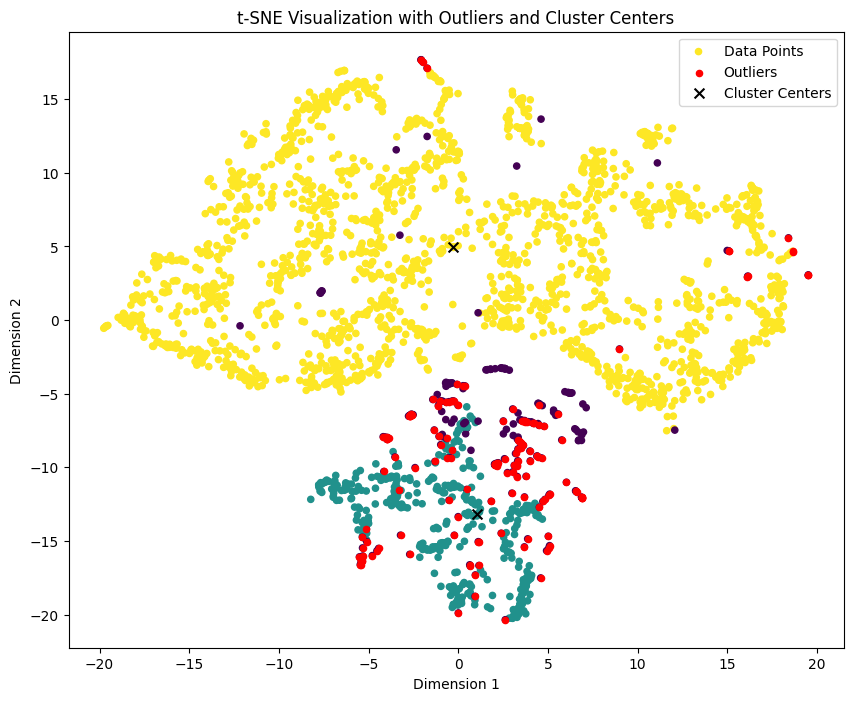

Number of anomalies: 163


C:\Users\34665\AppData\Local\Temp\ipykernel_25508\3231398334.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.

C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.

C:\Users\34665\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An err

Number of anomalies found after adding new features to the dataframe:
Anomalies: 77
Non-Anomalies: 172
Details of Anomalies:
       thingy006_color_b                                                  \
minute                 0          10          20          30          40   
count         249.000000  249.000000  249.000000  249.000000  249.000000   
mean            9.060766    9.477839   10.144939   10.747819   11.128813   
std             8.964681    7.406790    5.334685    4.361386    3.949045   
min             1.000000    1.000000    1.089837    1.089837    1.089837   
25%             1.449183    1.898367    7.378403    9.624319   10.343013   
50%            10.612523   11.241379   11.690563   11.960073   12.049909   
75%            13.397459   13.487296   13.577132   13.666969   13.846642   
max           100.000000   91.735027   42.145191   18.697822   16.811252   

                   thingy006_color_c                                      ...  \
minute          50               

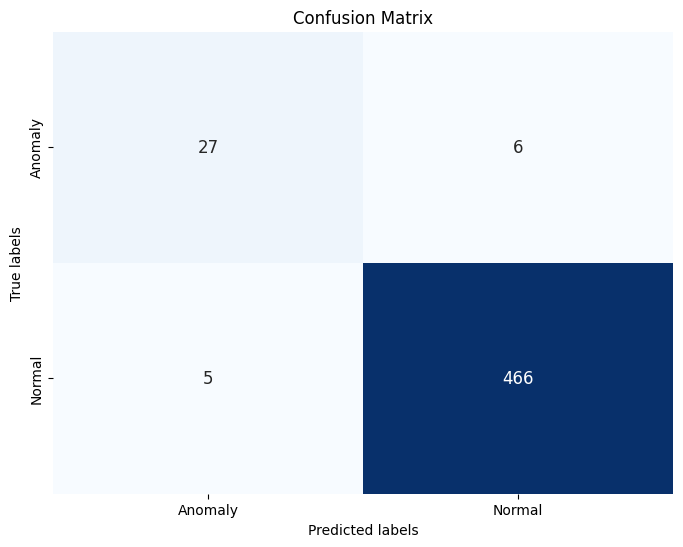

('thingy006_color_r', 0): Importance = 0.05601269458110297
('sound_change_mean', ''): Importance = 0.05408618596115239
('light_change_mean', ''): Importance = 0.05156983557266566
('thingy006_color_g', 0): Importance = 0.04862901628684881
('thingy006_color_c', 0): Importance = 0.039879242486744855
('thingy006_color_b', 0): Importance = 0.036525930861826955
('thingy006_color_g', 20): Importance = 0.03638718808801918
('thingy006_color_c', 50): Importance = 0.03616711974472406
('thingy006_color_g', 50): Importance = 0.032296406193381935
('thingy006_color_b', 20): Importance = 0.031130280174824134
('thingy006_color_g', 30): Importance = 0.030490080707935276
('thingy006_color_r', 20): Importance = 0.030190122408226168
('thingy006_eCO2', 40): Importance = 0.029335309910321967
('thingy006_color_r', 30): Importance = 0.028333482198570573
('thingy006_color_b', 40): Importance = 0.02727459173667728
('thingy006_color_b', 50): Importance = 0.027251428376509824
('thingy006_color_b', 30): Importance 

In [26]:
room = "006"
room_type = "office"
outlier_threshold = 60.0 #The samaller the distance the more anomalies found

datasets = load_datasets(room)

combined_dataset = preprocess_data(datasets, room)

new_features_df = pivot_and_resample(combined_dataset)

optimal_clusters = silhouete_number()
print("optimal number of clusters based on silhouette_score =", optimal_clusters)

kmeans = k_means(optimal_clusters) #Change if silhoutte score does not match the expected output
kmeans_labels = kmeans.labels_

# Creating hdbscan model
best_params = hdbscan_score()
hdbscan_model = hdb_model()
representative_points_df = hdbscan_cluster_centers()

#choose model
choosen_model = choose_model()
cluster_labels = choosen_model['cluster_labels']
cluster_centers = choosen_model['cluster_centers']
print("The choosen model is = ", choosen_model['model_choosen'])

outlier_indices = visualization(new_features_df)
outlier_data = new_features_df.iloc[outlier_indices]

anomalie_num(new_features_df)

add_features(new_features_df)

model = supervised(new_features_df)

feature_importance(model, new_features_df)

In [27]:

# Collect garbage to free up memory
import gc
gc.collect()

2482